## Image Preparation ##

This notebook creates labeled image tiles from the raw slide data described in 'train.csv'.  Tiles for Convolutional Neural Network training are taken from Whole-Slide Images and Tissue Microarrays.  The tiles are scaled to 256x256x3 for training.  

Rather than tile every section of tissue on every slide, sections of tissue with stain present are kept.  This is based on the ratio of intensity of the blue and green channels, and the intensity of the blue channel.  

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

from PIL import Image, ImageFilter
Image.MAX_IMAGE_PIXELS = None

import skimage
from skimage.util import random_noise

import os
import shutil

from tqdm import tqdm

In [2]:
DATA_DIR = '/kaggle/input/UBC-OCEAN/'
os.listdir(DATA_DIR)

['updated_image_ids.json',
 'test_thumbnails',
 'sample_submission.csv',
 'train_images',
 'train_thumbnails',
 'train.csv',
 'test.csv',
 'test_images']

In [3]:
# Open the training dataframe and display the initial dataframe
DATA_DIR = '/kaggle/input/UBC-OCEAN/'

train_images=os.listdir(DATA_DIR+'train_images')
train_thumbnails=os.listdir(DATA_DIR+'train_thumbnails')

In [4]:
train_df=pd.read_csv(DATA_DIR+'train.csv')
train_df.head()

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False


In [5]:
#Add Image, Thumb paths, numerical label

def addimgpath(row):
    img=row['image_id']
    img=str(img)+'.png'
    if img in train_images:
        return DATA_DIR+'train_images/'+img
    else:
        return None
    
def addthumbpath(row):
    img=row['image_id']
    img=str(img)+'_thumbnail.png'
    if img in train_thumbnails:
        return DATA_DIR+'train_thumbnails/'+img
    else:
        return None 

def assign_label(row):
    label=row['label']
    return labels.index(label)
    
    
labels=list(train_df['label'].unique())
train_df['label_id']=train_df[['label']].apply(assign_label, axis=1)

train_df['img_path']=train_df[['image_id']].apply(addimgpath, axis=1)
train_df['thumb_path']=train_df[['image_id']].apply(addthumbpath, axis=1)


In [6]:
train_df.head(5)

,image_id,label,image_width,image_height,is_tma,label_id,img_path,thumb_path
0,4,HGSC,23785,20008,False,0,/kaggle/input/UBC-OCEAN/train_images/4.png,/kaggle/input/UBC-OCEAN/train_thumbnails/4_thu...
1,66,LGSC,48871,48195,False,1,/kaggle/input/UBC-OCEAN/train_images/66.png,/kaggle/input/UBC-OCEAN/train_thumbnails/66_th...
2,91,HGSC,3388,3388,True,0,/kaggle/input/UBC-OCEAN/train_images/91.png,None
3,281,LGSC,42309,15545,False,1,/kaggle/input/UBC-OCEAN/train_images/281.png,/kaggle/input/UBC-OCEAN/train_thumbnails/281_t...
4,286,EC,37204,30020,False,2,/kaggle/input/UBC-OCEAN/train_images/286.png,/kaggle/input/UBC-OCEAN/train_thumbnails/286_t...


In [7]:
def keep_patch(patch, size):
    #receives color patch array, determines if masked or non-specimen (blank) in majority of patch
    #force np.float64 with *1.0 -> r+b+g won't roll over if exceeds 128 (uint8)
    red=patch[:,:,0]*1.0 + 0.001
    green=patch[:,:,1]*1.0 + 0.001
    blue=patch[:,:,2]*1.0 + 0.001
    
    #Find masked and blank regions
    blank=np.where((red+blue+green)>3) #not black/masked
    white=np.where((red+blue+green)<630)
    
    #Find where blue intensity exceeds threshold where blue > green
    bg=np.where(blue/green<=1.0, 0, blue)
    bg=np.where(bg<100,0,1)

    #criteria - Image size
    sz=size**2
    
    #Filter by percentages of total image
    if blank[0].shape[0]>.8*sz and white[0].shape[0]>0.5*sz and bg.mean()>0.4:
        return True
    else:
        return False

In [8]:
def get_thumb_coords(image_array, ws):
    #gets coordinates for thumb
    #returns bboxes within image based on intensity metrics
    
    #set up moving window
    dims=image_array.shape
    
    #height, width
    steps=[dims[0]//ws, dims[1]//ws]

    coords=[]
    for i in range(steps[0]):
        for j in range(steps[1]):
            patch=image_array[ws*i:ws*i+ws, ws*j:ws*j+ws]
            
            #screen patch based on mask, blank, blue/green content criteria
            decision = keep_patch(patch, ws)
            if decision:
                coords.append([i*ws, i*ws+ws, j*ws, j*ws+ws])
    
    return coords, dims

In [9]:
#make directory for each label
dirs=os.listdir()

#remove Images if exists from testing
if 'ImagesTrain' in dirs:
    shutil.rmtree('ImagesTrain')
if 'ImagesVal' in dirs:
    shutil.rmtree('ImagesVal')
    
for label in labels:
    path='ImagesTrain/'+label
    os.makedirs(path, exist_ok=True)

    path='ImagesVal/'+label
    os.makedirs(path, exist_ok=True)

In [10]:
#Some classes have more specimens than others
#This routine sets an upper limit of samples per slide to store, to keep the saved thumbnails approximately even
def img_per_class(imgclass):
    #Class imbalance - sample adjustments ~1000 train images per class @ 256x256
    if imgclass == 'HGSC':
        return 5
    elif imgclass =='EC':
        return 9
    elif imgclass == 'CC':
        return 13
    elif imgclass == 'MC':
        return 999
    elif imgclass == 'LGSC':
        return 999

In [11]:
#Generates filename, padded with zeros based on cumulative files
def generate_fname(label, fnum):
    #generate file numbers
    if fnum>=100000:  
        fname=label+'_'+str(fnum)
    elif fnum>=10000:  
        fname=label+'_0'+str(fnum)
    elif fnum>=1000 and fnum <10000:
        fname=label+'_00'+str(fnum)
    elif fnum>=100 and fnum <1000:
        fname=label+'_000'+str(fnum)
    elif fnum>=10 and fnum <100:
        fname=label+'_0000'+str(fnum)
    elif fnum <10:
        fname=label+'_00000'+str(fnum)
        
    return fname

In [12]:
#Train/Test/Val split assigmnet
#Thumbnails assigned to folders for TensorFlow dataloader from folders
def test_train_val(label):
    #Assign Train/Test/Val
    val = np.random.random()
        
    #Train data
    if val <=0.8:
        path='ImagesTrain/'+label+'/'
    #Validation
    else:
        path='ImagesVal/'+label+'/'

        
    return path

In [13]:
#Window size for searching in thumbnail
ws=256
fs=1024

#Get data from thumbnail images
labels_saved=[0,0,0,0,0]

#column for thumbnail coordinates ranked by intensity in filters/thresholds
train_df['thumbcoords']=None
train_df['thumbdims']=None

#force early termination for testing --> set loops <=5
limit=0
loops=2000

#make repeatable
np.random.seed(37)

for idx, row in train_df.iterrows():
    thumb=row['thumb_path']
    if thumb==None:
        #No full size image
        continue
    if limit>loops:
        continue
        
    if limit%20 == 0:
        print(limit, thumb)
    
    #Class imbalance - sample adjustments ~1000 train images per class @ 256x256
    label=row['label']
    samples_per_image=img_per_class(label)
   
    #Open thumbnail
    img=Image.open(thumb)
    imgarray=np.array(img)
    
    #search thumbnail 
    coords, dims =get_thumb_coords(imgarray, ws)
    
    #assign to df
    train_df.at[idx,'thumbcoords']=coords
    train_df.at[idx,'thumbdims']=dims
    
    #==========================================================
    #open big image
    fullpath=row['img_path']
    fullimg=Image.open(fullpath)
    
    #determine large image coordinates
    #capture 4 images surroudning center pt.
    thumbheight=dims[0]
    thumbwidth=dims[1]
    imgheight=row['image_height']
    imgwidth=row['image_width']
    htratio=imgheight/thumbheight
    wdratio=imgwidth/thumbwidth
    
    #capture thumbnail crop
    np.random.shuffle(coords)
    for coord in coords[:samples_per_image]:
        
        #Aready passed quality checks
        region=imgarray[coord[0]:coord[1],coord[2]:coord[3]]
        
        #to PIL - thumbnail
        region1=Image.fromarray(np.uint8(region))
        
        #Generate file name
        fnum=labels_saved[labels.index(label)]
        fname=generate_fname(label, fnum)
        path=test_train_val(label)
        #Save thumbnail
        region1.save(path+fname+'.png')
        

        #==========================================================
        #Center of small image, base for 4 large images
        ctrht=int(htratio*(coord[0]+coord[1])//2)
        ctrwd=int(wdratio*(coord[2]+coord[3])//2)
        
        #4 quadrants surrounding center:
        #save high-res. resized as-is, and with noise
        
        #upper left
        fullcrop=fullimg.crop((ctrwd-fs, ctrht-fs, ctrwd, ctrht))
        fullcrop=fullcrop.resize((ws,ws))
        patch=np.array(fullcrop)
        decision = keep_patch(patch, ws)
        if decision:
            fullcrop.save(path+fname+'_a.png')
            
            fcarray=np.array(fullcrop)
            noise_img = random_noise(fcarray, mode='poisson')
            noise_img = (255*noise_img).astype(np.uint8)
            img = Image.fromarray(noise_img)
            img.save(path+fname+'_a_noise.png')
            
            #fullcrop.filter(ImageFilter.GaussianBlur(radius=2)).save(path+fname+'_a_bl.png')

         
        #upper right
        fullcrop=fullimg.crop((ctrwd, ctrht-fs, ctrwd+fs, ctrht))
        fullcrop=fullcrop.resize((ws,ws))
        patch=np.array(fullcrop)
        decision = keep_patch(patch, ws)
        if decision:
            fullcrop.save(path+fname+'_b.png')
            
            fcarray=np.array(fullcrop)
            noise_img = random_noise(fcarray, mode='poisson')
            noise_img = (255*noise_img).astype(np.uint8)
            img = Image.fromarray(noise_img)
            img.save(path+fname+'_b_noise.png')

        #lower left
        fullcrop=fullimg.crop((ctrwd-fs, ctrht, ctrwd, ctrht+fs))
        fullcrop=fullcrop.resize((ws,ws))
        patch=np.array(fullcrop)
        decision = keep_patch(patch, ws)
        if decision:
            fullcrop.save(path+fname+'_c.png')
            
            fcarray=np.array(fullcrop)
            noise_img = random_noise(fcarray, mode='poisson')
            noise_img = (255*noise_img).astype(np.uint8)
            img = Image.fromarray(noise_img)
            img.save(path+fname+'_c_noise.png')
 
        #lower right
        fullcrop=fullimg.crop((ctrwd, ctrht, ctrwd+fs, ctrht+fs))
        fullcrop=fullcrop.resize((ws,ws))
        patch=np.array(fullcrop)
        decision = keep_patch(patch, ws)
        if decision:
            fullcrop.save(path+fname+'_d.png')
            
            fcarray=np.array(fullcrop)
            noise_img = random_noise(fcarray, mode='poisson')
            noise_img = (255*noise_img).astype(np.uint8)
            img = Image.fromarray(noise_img)
            img.save(path+fname+'_d_noise.png')

        #increment for filename
        labels_saved[labels.index(label)]=labels_saved[labels.index(label)]+1
        

    #counter for early termination
    limit=limit+1


0 /kaggle/input/UBC-OCEAN/train_thumbnails/4_thumbnail.png
20 /kaggle/input/UBC-OCEAN/train_thumbnails/2227_thumbnail.png
40 /kaggle/input/UBC-OCEAN/train_thumbnails/4877_thumbnail.png
60 /kaggle/input/UBC-OCEAN/train_thumbnails/6582_thumbnail.png
80 /kaggle/input/UBC-OCEAN/train_thumbnails/9254_thumbnail.png
100 /kaggle/input/UBC-OCEAN/train_thumbnails/12222_thumbnail.png
120 /kaggle/input/UBC-OCEAN/train_thumbnails/15209_thumbnail.png
140 /kaggle/input/UBC-OCEAN/train_thumbnails/17291_thumbnail.png
160 /kaggle/input/UBC-OCEAN/train_thumbnails/19512_thumbnail.png
180 /kaggle/input/UBC-OCEAN/train_thumbnails/22290_thumbnail.png
200 /kaggle/input/UBC-OCEAN/train_thumbnails/25923_thumbnail.png
220 /kaggle/input/UBC-OCEAN/train_thumbnails/28066_thumbnail.png
240 /kaggle/input/UBC-OCEAN/train_thumbnails/30508_thumbnail.png
260 /kaggle/input/UBC-OCEAN/train_thumbnails/32192_thumbnail.png
280 /kaggle/input/UBC-OCEAN/train_thumbnails/35652_thumbnail.png
300 /kaggle/input/UBC-OCEAN/train_thumb

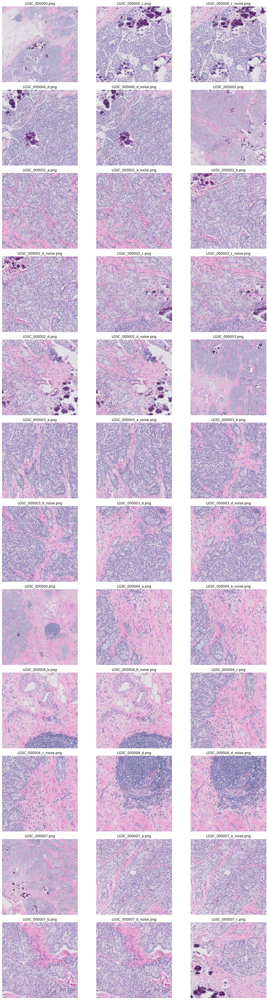

In [18]:
#Plot some training tiles for verification
path='/kaggle/working/ImagesTrain/LGSC/'
files=os.listdir(path)
files.sort()

plt.figure(figsize=(15, 50))    
for i, file in enumerate(files[:36]):
    img=Image.open(path+file)
    data=np.array(img)
    ax = plt.subplot(12, 3, i + 1)
    plt.imshow(data)
    plt.title(file)
    plt.axis("off")
plt.tight_layout()

In [22]:
#Function to calculation total file size of tiles - Kaggle zips datasets above ~10GB, extra steps required later
def get_size(start_path = '.'):
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(start_path):
        for f in filenames:
            fp = os.path.join(dirpath, f)
            # skip if it is symbolic link
            if not os.path.islink(fp):
                total_size += os.path.getsize(fp)

    return total_size//1024//1024



In [23]:
print('Size of files: ', get_size(), 'MB')

Size of files:  5038 MB
